In [1]:
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.applications.resnet50 import decode_predictions
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import json
import cv2
import random
import sys
import os
import torch
from PIL import Image

# Get the absolute path of the src folder
sys.path.append(os.path.abspath("src"))

from utils_attack import compute_psnr, compute_ssim, compute_msssim, eval_psnr_ssim_msssim, bytearray_to_bits
from regen_pipe import ReSDPipeline
from regen_attack import DiffWMAttacker
from utils import show_image, preprocess_image, clip_eps, get_label
from whitebox import generate_adversaries_targeted, perturb_image, verify_watermark

2025-03-06 13:37:18.529017: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-06 13:37:18.529055: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-06 13:37:18.530610: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-06 13:37:18.540949: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
tf.keras.backend.clear_session()

In [3]:
wm_text = 'test'
device = 'cuda:0'

print_width = 50

In [4]:
pipe = ReSDPipeline.from_pretrained("stabilityai/stable-diffusion-2-1", torch_dtype=torch.float16, revision="fp16")
pipe.set_progress_bar_config(disable=True)
pipe.to(device)
print('Finished loading model')

/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/pipeline_loading_utils.py:242: FutureWarning: You are loading the variant fp16 from stabilityai/stable-diffusion-2-1 via `revision='fp16'` even though you can load it via `variant=`fp16`. Loading model variants via `revision='fp16'` is deprecated and will be removed in diffusers v1. Please use `variant='fp16'` instead.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

An error occurred while trying to fetch /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /tmp/xdg-cache/huggingface/hub/models--stabilityai--stable-diffusion-2-1/snapshots/f7f33030acc57428be85fbec092c37a78231d75a/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
/opt/conda/lib/python3.11/site-packages/transformers/tokenization_utils_ba

Finished loading model


In [5]:
resnet50 = tf.keras.applications.ResNet50(weights="imagenet", include_top=True, classifier_activation=None)
original_image_path = "examples/panda.jpg"

2025-03-06 13:37:31.526971: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 7986 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1080 Ti, pci bus id: 0000:89:00.0, compute capability: 6.1


In [5]:
attackers = {
    'diff_attacker_60': DiffWMAttacker(pipe, batch_size=5, noise_step=30, captions={})
}

Diffuse attack initialized with noise step 30 and use prompt 0


In [6]:
# Define paths for the input and output of the attack
  # Input image
watermarked_img_path = "./output/whitebox_watermarked_image.jpg"
attacked_img_path = "./output/perturbed_panda_attacked.jpg"


image = Image.open(watermarked_img_path).convert("RGB")

attacker_name = "diff_attacker_60"
attacker = attackers[attacker_name]   # Select the attacker

print('*' * print_width)
print(f'Attacking PGD WhiteBox Watermark with {attacker_name}')


# Move attacker model to CUDA if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
attacker.pipe.to(device)  # Ensure the model is on the right device

# Apply the attack
attacker.attack([watermarked_img_path], [attacked_img_path])

print('Finished attacking')

**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00,  2.58it/s]
/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:308: FutureWarning: `_encode_prompt()` is deprecated and it will be removed in a future version. Use `encode_prompt()` instead. Also, be aware that the output format changed from a concatenated tensor to a tuple.
  deprecate("_encode_prompt()", "1.0.0", deprecation_message, standard_warn=False)


Finished attacking


/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:594: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


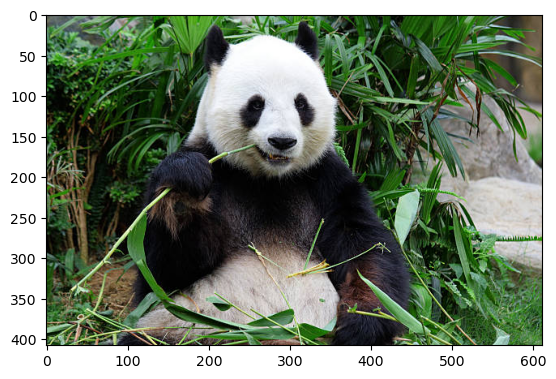

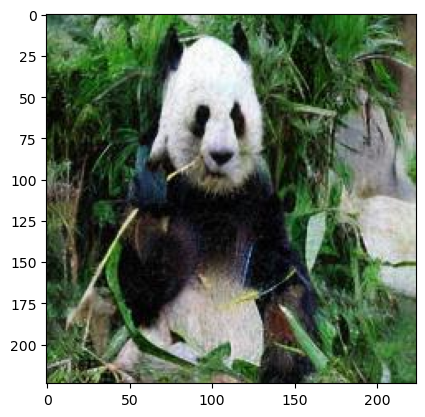

2025-03-05 23:29:58.372928: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:459] Could not create cudnn handle: CUDNN_STATUS_NOT_INITIALIZED
2025-03-05 23:29:58.372985: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:463] Memory usage: 4259840 bytes free, 11714887680 bytes total.
2025-03-05 23:29:58.373082: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Possibly insufficient driver version: 535.161.8
2025-03-05 23:29:58.373105: W tensorflow/core/framework/op_kernel.cc:1839] OP_REQUIRES failed at conv_ops_impl.h:1199 : UNIMPLEMENTED: DNN library is not found.


UnimplementedError: Graph execution error:

Detected at node resnet50/conv1_conv/Conv2D defined at (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main

  File "<frozen runpy>", line 88, in _run_code

  File "/opt/conda/lib/python3.11/site-packages/ipykernel_launcher.py", line 18, in <module>

  File "/opt/conda/lib/python3.11/site-packages/traitlets/config/application.py", line 1075, in launch_instance

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/kernelapp.py", line 739, in start

  File "/opt/conda/lib/python3.11/site-packages/tornado/platform/asyncio.py", line 205, in start

  File "/opt/conda/lib/python3.11/asyncio/base_events.py", line 608, in run_forever

  File "/opt/conda/lib/python3.11/asyncio/base_events.py", line 1936, in _run_once

  File "/opt/conda/lib/python3.11/asyncio/events.py", line 84, in _run

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 545, in dispatch_queue

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 534, in process_one

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 437, in dispatch_shell

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 359, in execute_request

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/kernelbase.py", line 778, in execute_request

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 446, in do_execute

  File "/opt/conda/lib/python3.11/site-packages/ipykernel/zmqshell.py", line 549, in run_cell

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3075, in run_cell

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3130, in _run_cell

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/async_helpers.py", line 129, in _pseudo_sync_runner

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3334, in run_cell_async

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3517, in run_ast_nodes

  File "/opt/conda/lib/python3.11/site-packages/IPython/core/interactiveshell.py", line 3577, in run_code

  File "/tmp/ipykernel_160/311693488.py", line 9, in <module>

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 2655, in predict

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 2440, in predict_function

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 2425, in step_function

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 2413, in run_step

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 2381, in predict_step

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/training.py", line 590, in __call__

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/functional.py", line 515, in call

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/functional.py", line 672, in _run_internal_graph

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 65, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/engine/base_layer.py", line 1149, in __call__

  File "/opt/conda/lib/python3.11/site-packages/keras/src/utils/traceback_utils.py", line 96, in error_handler

  File "/opt/conda/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py", line 290, in call

  File "/opt/conda/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py", line 262, in convolution_op

DNN library is not found.
	 [[{{node resnet50/conv1_conv/Conv2D}}]] [Op:__inference_predict_function_5086]

In [7]:
sample_image_org = show_image(original_image_path)
preprocessed_image_org = preprocess_image(sample_image_org)
image_tensor_org = tf.constant(preprocessed_image_org, dtype=tf.float32)

sample_image_att = show_image(attacked_img_path)
preprocessed_image = preprocess_image(sample_image_att)
image_tensor_att = tf.constant(preprocessed_image, dtype=tf.float32)

original_logits = resnet50.predict(preprocess_input(image_tensor_org))
attacked_logits = resnet50.predict(preprocess_input(image_tensor_att))


In [ ]:
verified, avg_diff = verify_watermark(original_logits, attacked_logits,
                 [85, 289, 980, 839])

verified,avg_diff

In [18]:
gaussian_noise_psnr, ssim_value, msssim_value = eval_psnr_ssim_msssim("./output/preprocessed_image.png", "./output/attacked_images/perturbed_panda_attacked7.jpg")

print(f"PSNR: {gaussian_noise_psnr}")
print(f"SSIM: {ssim_value}")
print(f"MS-SSIM: {msssim_value}")

PSNR: 17.33575929266496
SSIM: 0.3862488567829132
MS-SSIM: 0.7822778820991516


In [ ]:
#attack noise level
#x axis - attack noise level
#y axis - logit difference

Secret labels: [263, 651, 329, 760]
Secret label names: ['Pembroke', 'microwave', 'sea_cucumber', 'refrigerator']


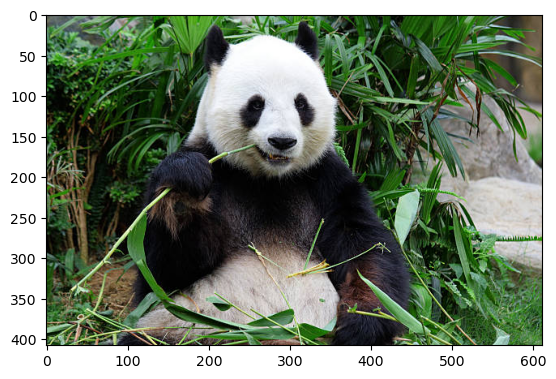

Preprocessed image saved at: ./output/preprocessed_image.png


2025-03-06 13:38:04.800451: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


1/1 [==============================] - 2s 2s/step
Logits before adv.: [('n02510455', 'giant_panda', 17.555876), ('n02509815', 'lesser_panda', 10.108606), ('n02488702', 'colobus', 9.493948)]
True label (max logit): giant_panda (Index: 388)

Predictions for secret labels BEFORE perturbation:
Label: Pembroke (Index: 263), Logit: 2.2619469165802
Label: microwave (Index: 651), Logit: -1.1016944646835327
Label: sea_cucumber (Index: 329), Logit: -3.20035982131958
Label: refrigerator (Index: 760), Logit: -1.0020123720169067
Iteration 0, Loss: 73.2722396850586
Iteration 20, Loss: 47.789554595947266
Iteration 40, Loss: 37.018333435058594
Iteration 60, Loss: 34.81879425048828
Iteration 80, Loss: 34.13393783569336
Iteration 100, Loss: 33.49185562133789
Iteration 120, Loss: 32.90658187866211
Iteration 140, Loss: 32.390506744384766
Iteration 160, Loss: 31.899513244628906
Iteration 180, Loss: 31.429523468017578
Iteration 200, Loss: 30.981338500976562
Iteration 220, Loss: 30.53201675415039
Iteration 2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


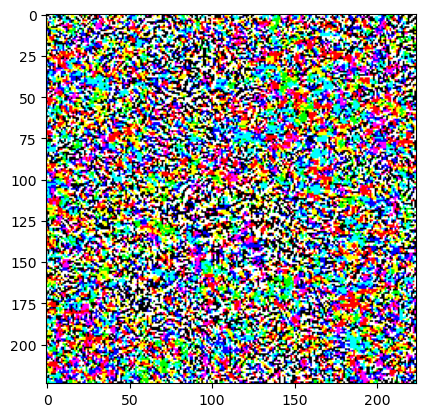

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Watermarked image saved as ./output/whitebox_watermarked_image.jpg


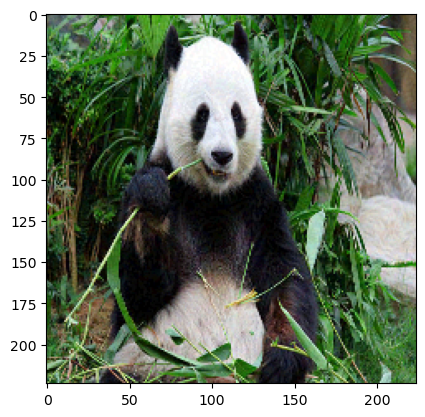

1/1 [==============================] - 0s 39ms/step
Logits after adv.: [('n02510455', 'giant_panda', 5.163721), ('n02447366', 'badger', 3.6906867), ('n02909870', 'bucket', 3.568859)]

Predictions for secret labels:
Label: Pembroke (Index: 263), Logit: 3.3136401176452637
Label: microwave (Index: 651), Logit: 1.6975374221801758
Label: sea_cucumber (Index: 329), Logit: -0.47037404775619507
Label: refrigerator (Index: 760), Logit: 1.910204291343689
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 3.31364 | Logit Diff: 1.05169
Label: microwave (651) | Logit Before: -1.10169 | Logit After: 1.69754 | Logit Diff: 2.79923
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -0.47037 | Logit Diff: 2.72999
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: 1.91020 | Logit Diff: 2.91222
Average Difference: 2.3732818961143494
Watermark verified!


({263: 2.261947, 651: -1.1016945, 329: -3.2003598, 760: -1.0020124},
 {263: 3.31364, 651: 1.6975374, 329: -0.47037405, 760: 1.9102043},
 array([[ 9.52393591e-01, -4.79558617e-01, -2.22569275e+00,
         -1.96099436e+00, -2.96404648e+00, -2.92505097e+00,
         -2.63053250e+00,  7.97110081e-01,  2.15644765e+00,
         -1.02854049e+00, -2.68108368e+00,  6.95023715e-01,
         -3.19588757e+00, -1.01657879e+00, -1.27906132e+00,
         -2.31266022e+00, -8.94372940e-01,  1.84793150e+00,
          2.33602452e+00,  7.06812561e-01, -1.46577132e+00,
          2.19196844e+00,  9.18621540e-01,  4.84507895e+00,
          2.05166769e+00,  1.11293904e-01, -2.22452784e+00,
         -2.16713524e+00, -1.83833432e+00, -4.28726554e-01,
         -2.36644936e+00, -5.36717415e-01, -1.60146642e+00,
         -4.25495982e-01, -1.35958135e+00, -1.51927102e+00,
          2.77496934e+00, -1.37715316e+00, -3.10992980e+00,
         -4.43647593e-01, -2.09892106e+00, -2.91663027e+00,
         -4.24462587e-01

In [6]:
EPS = 3.5/255
IMAGENET_LABELS = "./data/imagenet_class_index.json"

with open(IMAGENET_LABELS) as f:
    IMAGENET_CLASSES = {int(i):x[1] for i,x in json.load(f).items()}

k = 4
secret_labels = random.sample(range(1000), k)
print("Secret labels:", secret_labels)
print("Secret label names:", [IMAGENET_CLASSES[label] for label in secret_labels])

optimizer = tf.keras.optimizers.legacy.Adam(learning_rate=5e-3)
perturb_image("./examples/panda.jpg", 388
              , secret_labels, resnet50, optimizer,EPS, 350)

Diffuse attack initialized with noise step 0 and use prompt 0


1it [00:00,  3.51it/s]
/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:308: FutureWarning: `_encode_prompt()` is deprecated and it will be removed in a future version. Use `encode_prompt()` instead. Also, be aware that the output format changed from a concatenated tensor to a tuple.
  deprecate("_encode_prompt()", "1.0.0", deprecation_message, standard_warn=False)
/home/amt007/.local/lib/python3.11/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:594: FutureWarning: The decode_latents method is deprecated and will be removed in 1.0.0. Please use VaeImageProcessor.postprocess(...) instead
  deprecate("decode_latents", "1.0.0", deprecation_message, standard_warn=False)


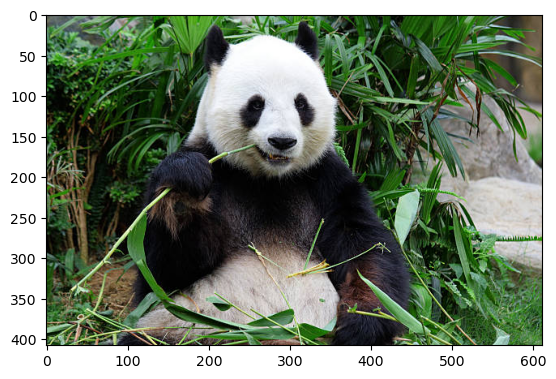

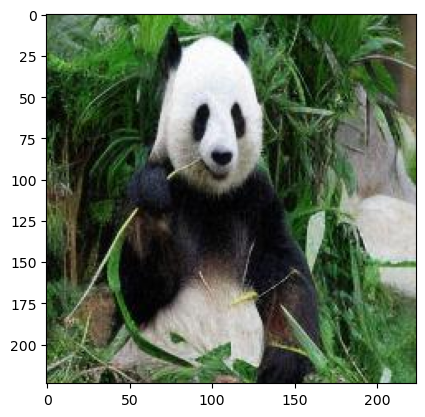

1/1 [==============================] - 0s 37ms/step
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 2.19453 | Logit Diff: -0.06741
Label: microwave (651) | Logit Before: -1.10169 | Logit After: -2.15005 | Logit Diff: -1.04835
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -2.12551 | Logit Diff: 1.07485
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: -1.08084 | Logit Diff: -0.07883
Average Difference: -0.02993762493133545
False -0.02993762493133545
Diffuse attack initialized with noise step 20 and use prompt 0


1it [00:00, 80.46it/s]


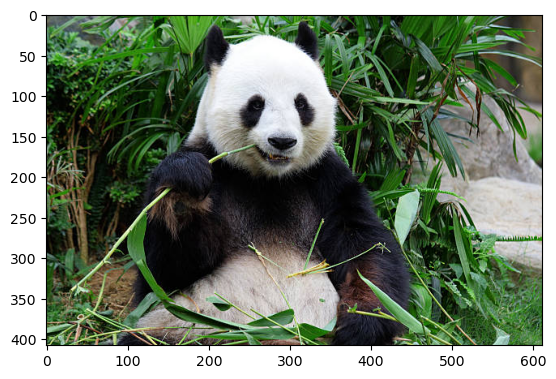

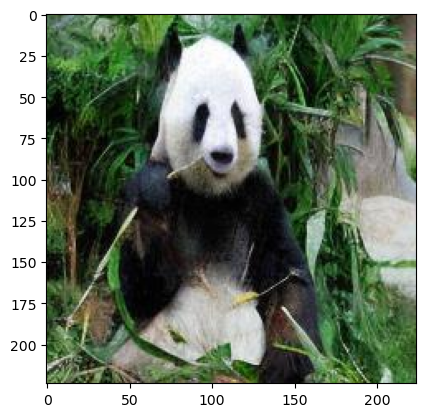

1/1 [==============================] - 0s 38ms/step
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 2.49431 | Logit Diff: 0.23237
Label: microwave (651) | Logit Before: -1.10169 | Logit After: -2.18204 | Logit Diff: -1.08034
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -2.49133 | Logit Diff: 0.70903
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: -1.07472 | Logit Diff: -0.07271
Average Difference: -0.052913933992385864
False -0.052913933992385864
Diffuse attack initialized with noise step 40 and use prompt 0


1it [00:00, 10.39it/s]


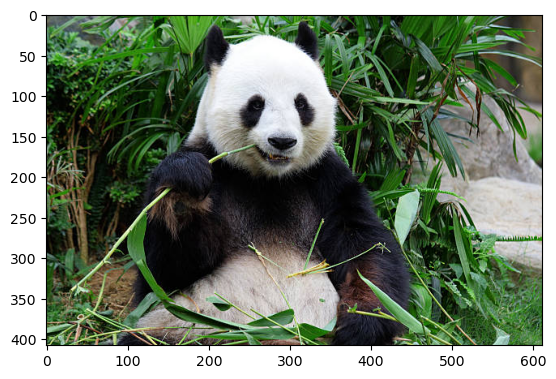

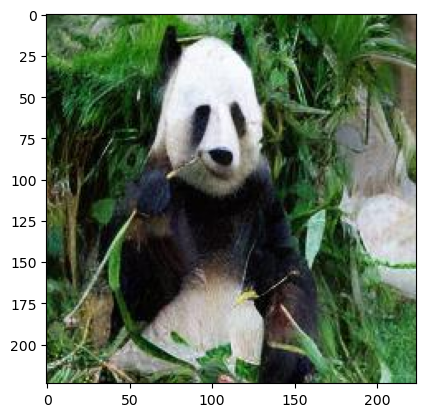

1/1 [==============================] - 0s 37ms/step
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 2.19748 | Logit Diff: -0.06447
Label: microwave (651) | Logit Before: -1.10169 | Logit After: -2.47739 | Logit Diff: -1.37569
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -2.17480 | Logit Diff: 1.02556
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: -1.35308 | Logit Diff: -0.35107
Average Difference: -0.19141775369644165
False -0.19141775369644165
Diffuse attack initialized with noise step 80 and use prompt 0


1it [00:00, 10.72it/s]


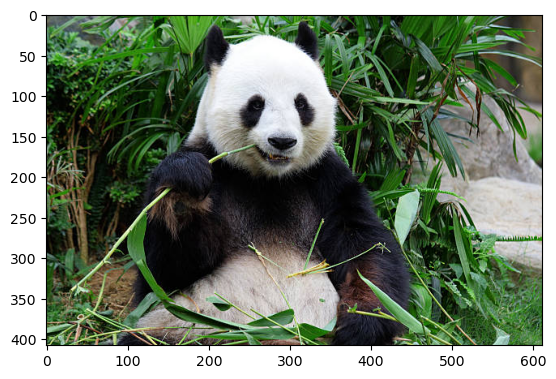

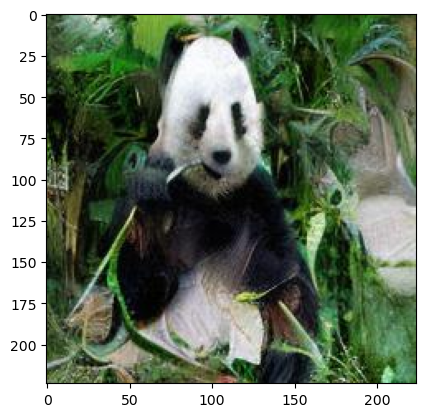

1/1 [==============================] - 0s 38ms/step
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 1.92883 | Logit Diff: -0.33312
Label: microwave (651) | Logit Before: -1.10169 | Logit After: -2.30866 | Logit Diff: -1.20696
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -0.74461 | Logit Diff: 2.45575
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: -1.10156 | Logit Diff: -0.09955
Average Difference: 0.2040286660194397
False 0.2040286660194397
Diffuse attack initialized with noise step 160 and use prompt 0


1it [00:00, 75.26it/s]


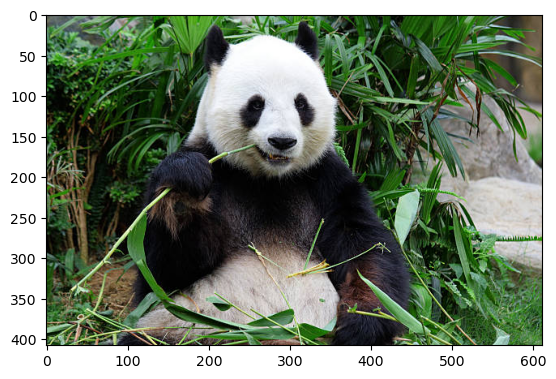

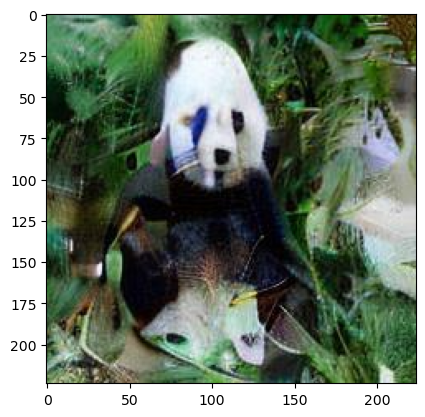

1/1 [==============================] - 0s 37ms/step
Label: Pembroke (263) | Logit Before: 2.26195 | Logit After: 1.64607 | Logit Diff: -0.61588
Label: microwave (651) | Logit Before: -1.10169 | Logit After: -2.52286 | Logit Diff: -1.42117
Label: sea_cucumber (329) | Logit Before: -3.20036 | Logit After: -1.72954 | Logit Diff: 1.47082
Label: refrigerator (760) | Logit Before: -1.00201 | Logit After: -2.54204 | Logit Diff: -1.54003
Average Difference: -0.5265646278858185
False -0.5265646278858185


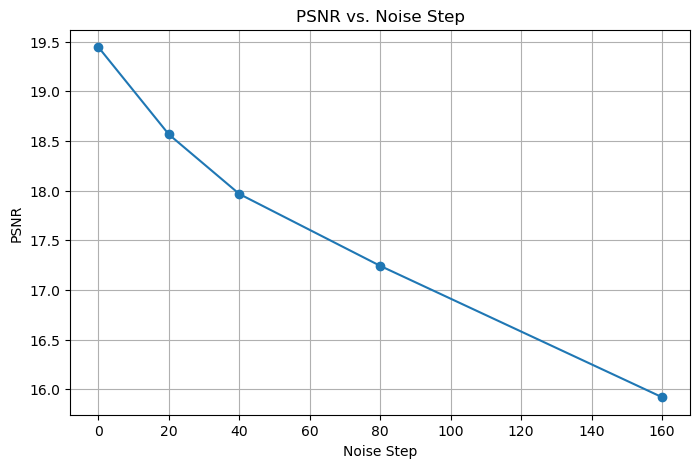

In [7]:

# Define different noise step values
noise_steps = [0, 20, 40, 80, 160]
psnr_values = []
watermarked_img_path = "./output/whitebox_watermarked_image.jpg"
# Run attack for each noise step
for step in noise_steps:
    attacker = DiffWMAttacker(pipe, batch_size=5, noise_step=step, captions={})
    attacked_img_path = f"./output/perturbed_panda_attacked_{step}.jpg"
    attacker.attack([watermarked_img_path], [attacked_img_path])

    sample_image_org = show_image(original_image_path)
    preprocessed_image_org = preprocess_image(sample_image_org)
    image_tensor_org = tf.constant(preprocessed_image_org, dtype=tf.float32)
    
    sample_image_att = show_image(attacked_img_path)
    preprocessed_image = preprocess_image(sample_image_att)
    image_tensor_att = tf.constant(preprocessed_image, dtype=tf.float32)
    
    original_logits = resnet50.predict(preprocess_input(image_tensor_org))
    attacked_logits = resnet50.predict(preprocess_input(image_tensor_att))

    verified, avg_diff = verify_watermark(original_logits, attacked_logits,
                secret_labels )
    print(verified, avg_diff)

    # Compute PSNR
    psnr, _, _ = eval_psnr_ssim_msssim("./output/preprocessed_image.png", attacked_img_path)
    psnr_values.append(psnr)

# Plot PSNR vs. Noise Step
plt.figure(figsize=(8, 5))
plt.plot(noise_steps, psnr_values, marker='o', linestyle='-')
plt.xlabel("Noise Step")
plt.ylabel("PSNR")
plt.title("PSNR vs. Noise Step")
plt.grid()
plt.show()

In [19]:
epsilon_values = np.arange(0, 8/255, 0.5/255)
logit_diffs = []
for e in epsilon_values:
    verified, avg_diff = verify_watermark(original_logits, attacked_logits,
                 [726, 264, 428, 190])

    

Processing image: epsilon_1.jpg
1
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 67.45it/s]


Finished attacking: epsilon_1.jpg


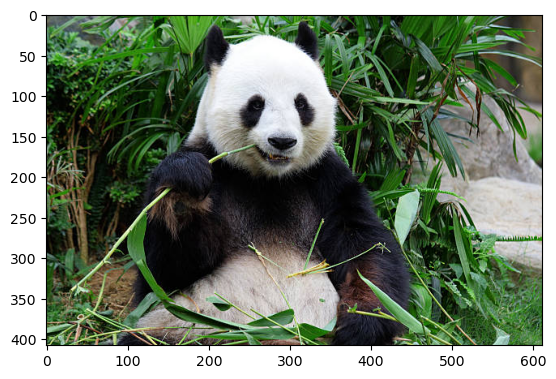

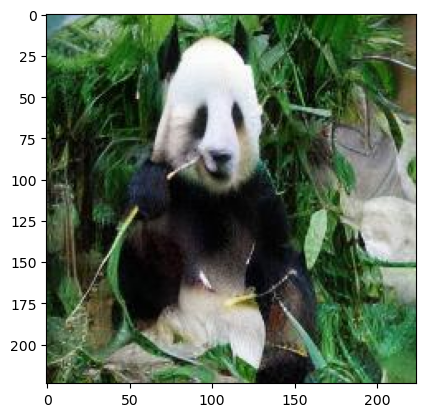

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.56367 | Logit Diff: 0.56550
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.00482 | Logit Diff: -1.16862
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.90176 | Logit Diff: -1.17081
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.64040 | Logit Diff: 3.23829
Average Difference: 0.3660907745361328
Processing image: epsilon_6.jpg
6
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 84.16it/s]


Finished attacking: epsilon_6.jpg


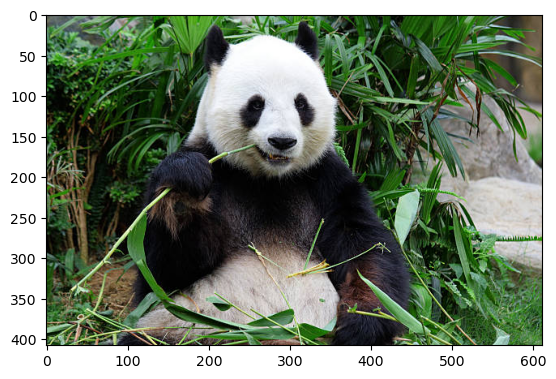

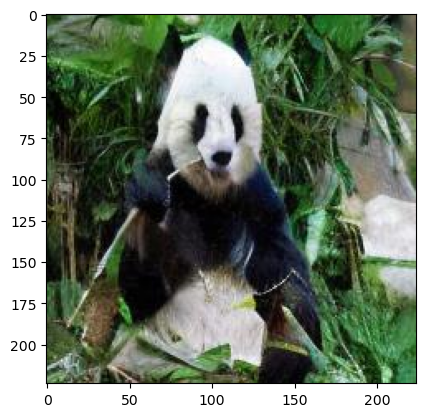

1/1 [==============================] - 0s 34ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -0.91710 | Logit Diff: 2.21207
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.44849 | Logit Diff: 0.27505
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.07837 | Logit Diff: -0.99421
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.90876 | Logit Diff: 3.50665
Average Difference: 1.2498920559883118
Processing image: epsilon_8.jpg
8
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 101.31it/s]


Finished attacking: epsilon_8.jpg


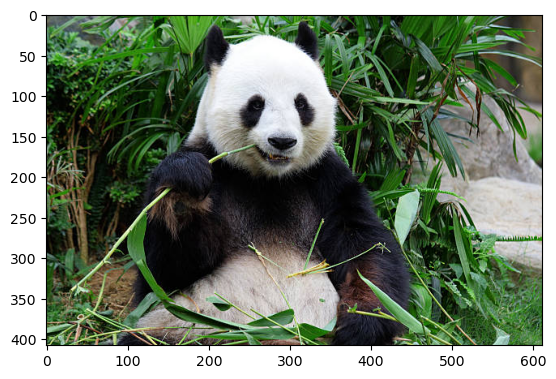

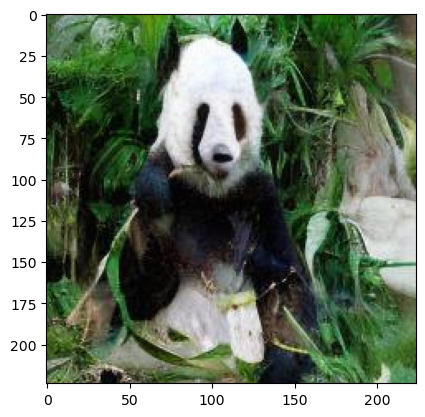

1/1 [==============================] - 0s 45ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.97289 | Logit Diff: 1.15628
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.39950 | Logit Diff: -0.77394
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.26425 | Logit Diff: -0.80832
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.27940 | Logit Diff: 2.87729
Average Difference: 0.6128279864788055
Processing image: epsilon_10.jpg
10
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 99.53it/s]


Finished attacking: epsilon_10.jpg


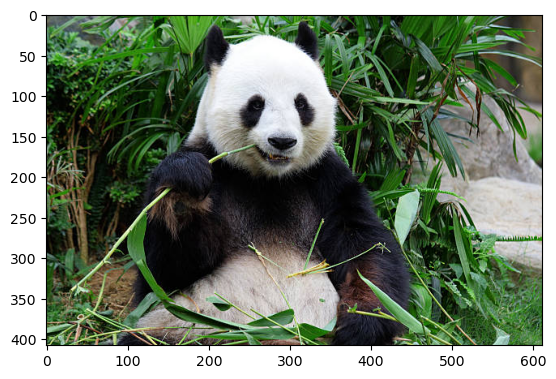

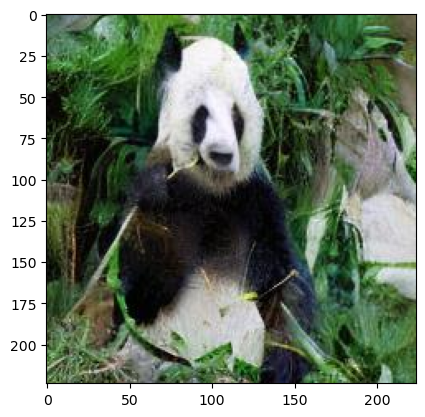

1/1 [==============================] - 0s 36ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -3.01349 | Logit Diff: 0.11567
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.94766 | Logit Diff: 0.77422
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.11714 | Logit Diff: 0.04456
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.15083 | Logit Diff: 1.74872
Average Difference: 0.6707948446273804
Processing image: epsilon_11.jpg
11
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 90.38it/s]


Finished attacking: epsilon_11.jpg


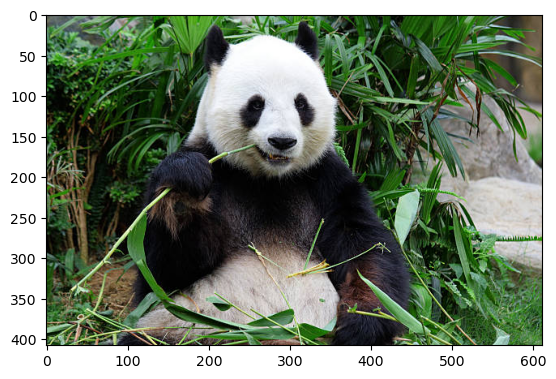

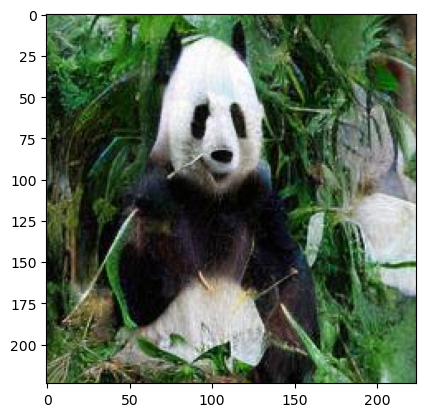

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.39082 | Logit Diff: 0.73835
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 1.97361 | Logit Diff: -1.19982
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.35147 | Logit Diff: -0.72111
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.30684 | Logit Diff: 1.90473
Average Difference: 0.18053865432739258
Processing image: epsilon_16.jpg
16
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 85.13it/s]


Finished attacking: epsilon_16.jpg


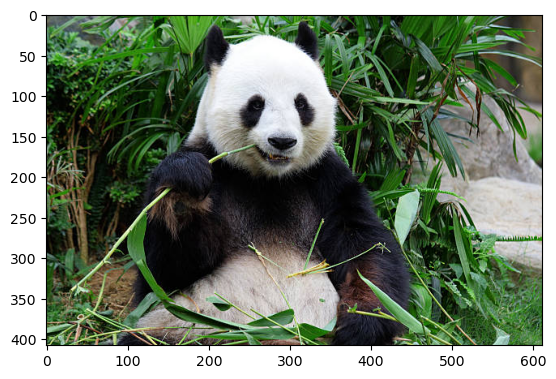

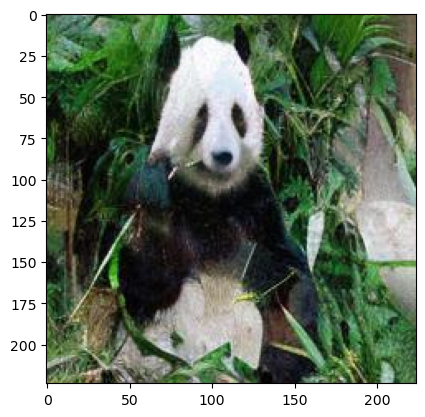

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.54372 | Logit Diff: 0.58545
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.32576 | Logit Diff: -0.84768
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.21059 | Logit Diff: -0.86199
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.03583 | Logit Diff: 2.63372
Average Difference: 0.3773752450942993
Processing image: epsilon_9.jpg
9
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 99.63it/s]


Finished attacking: epsilon_9.jpg


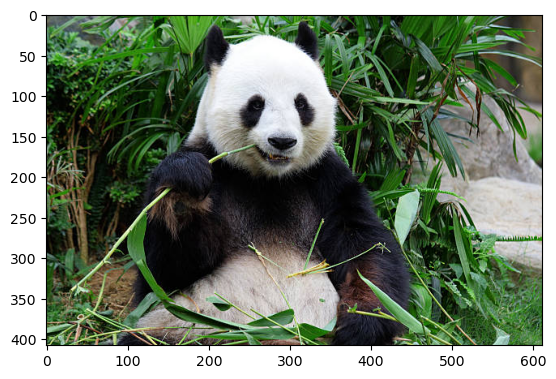

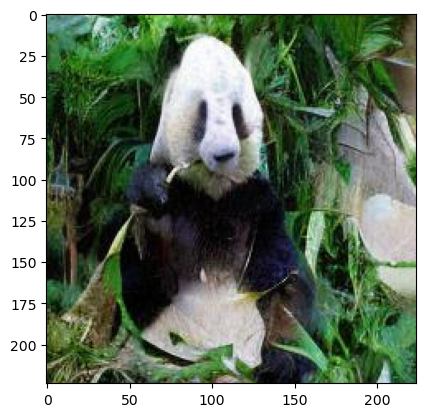

1/1 [==============================] - 0s 33ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.42506 | Logit Diff: 1.70411
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.24439 | Logit Diff: 0.07096
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.12659 | Logit Diff: -0.94599
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.81905 | Logit Diff: 2.41694
Average Difference: 0.8115046322345734
Processing image: epsilon_7.jpg
7
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 93.62it/s]


Finished attacking: epsilon_7.jpg


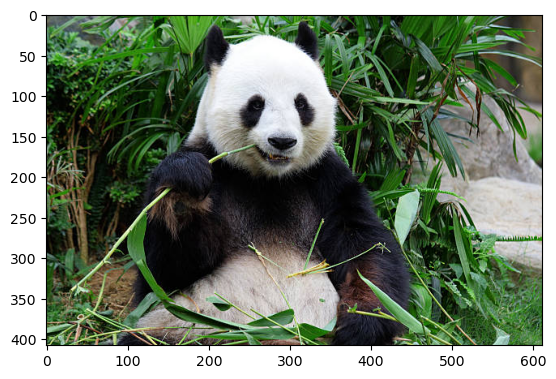

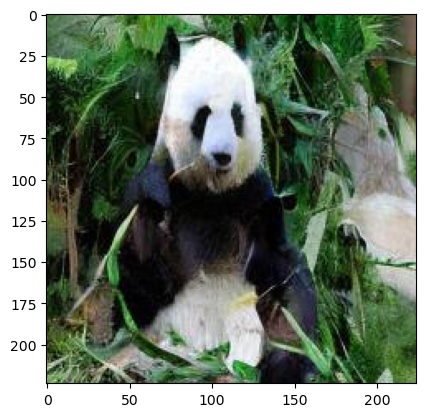

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -0.96223 | Logit Diff: 2.16694
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 4.27597 | Logit Diff: 1.10254
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.21064 | Logit Diff: 0.13806
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 6.12114 | Logit Diff: 4.71903
Average Difference: 2.0316412448883057
Processing image: epsilon_15.jpg
15
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 99.94it/s]


Finished attacking: epsilon_15.jpg


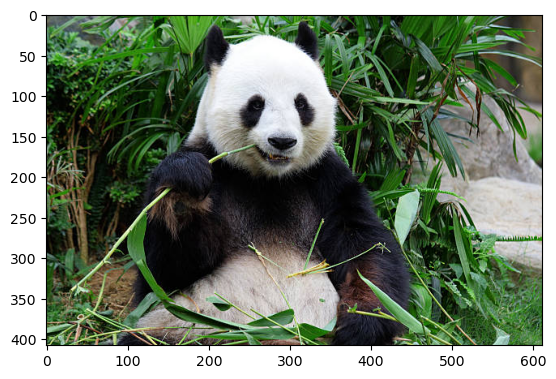

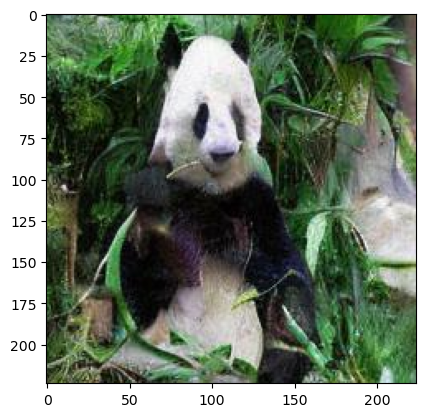

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.47982 | Logit Diff: 0.64935
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.24446 | Logit Diff: -0.92898
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.33342 | Logit Diff: 0.26084
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.22205 | Logit Diff: 1.81994
Average Difference: 0.4502887725830078
Processing image: epsilon_12.jpg
12
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 97.92it/s]


Finished attacking: epsilon_12.jpg


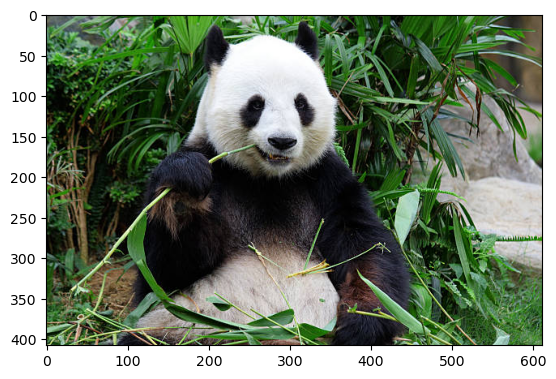

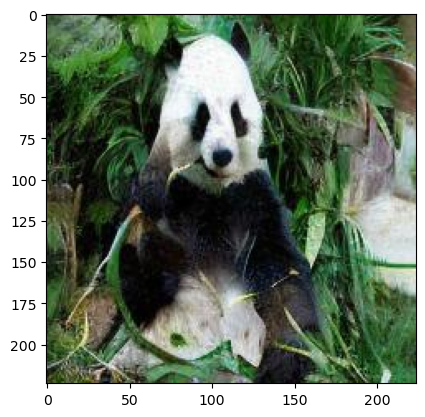

1/1 [==============================] - 0s 30ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.89340 | Logit Diff: 1.23577
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 3.66575 | Logit Diff: 0.49232
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.83482 | Logit Diff: -0.23775
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.42620 | Logit Diff: 3.02409
Average Difference: 1.1286057531833649
Processing image: epsilon_3.jpg
3
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 101.07it/s]


Finished attacking: epsilon_3.jpg


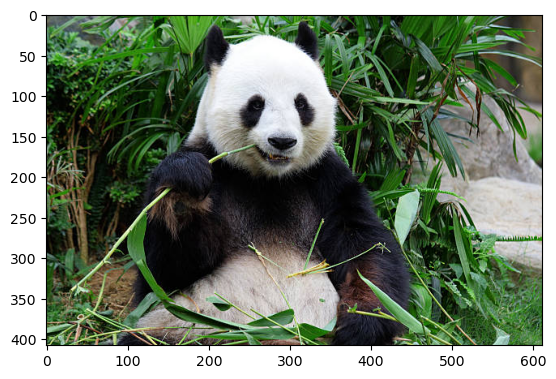

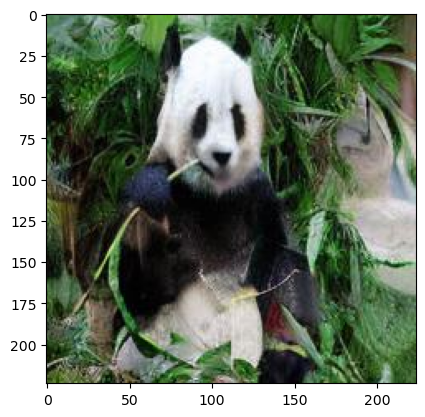

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.97422 | Logit Diff: 0.15495
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.60247 | Logit Diff: -0.57097
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 4.48086 | Logit Diff: 0.40828
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.98904 | Logit Diff: 1.58693
Average Difference: 0.39479947090148926
Processing image: epsilon_4.jpg
4
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 76.18it/s]


Finished attacking: epsilon_4.jpg


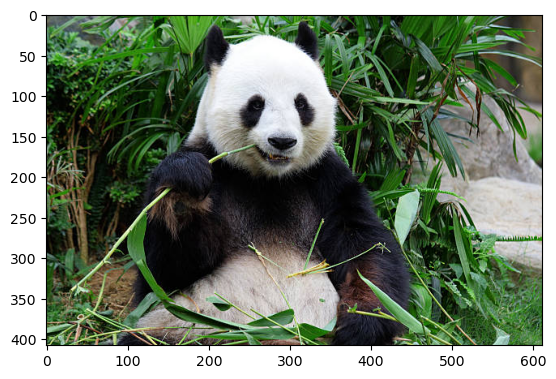

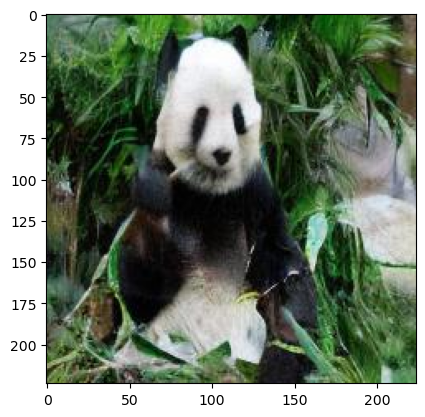

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.71253 | Logit Diff: 0.41664
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 1.81590 | Logit Diff: -1.35753
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 2.97831 | Logit Diff: -1.09426
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.40567 | Logit Diff: 2.00356
Average Difference: -0.00789731740951538
Processing image: epsilon_5.jpg
5
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 96.67it/s]


Finished attacking: epsilon_5.jpg


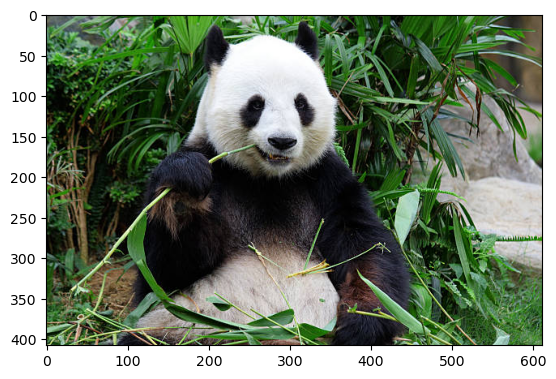

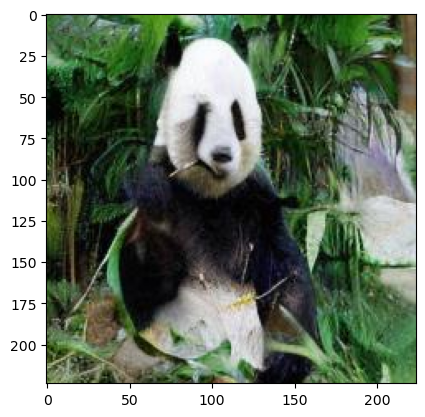

1/1 [==============================] - 0s 33ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.65135 | Logit Diff: 1.47782
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 4.56974 | Logit Diff: 1.39631
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.50925 | Logit Diff: -0.56333
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 4.26870 | Logit Diff: 2.86659
Average Difference: 1.2943468391895294
Processing image: epsilon_2.jpg
2
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 91.45it/s]


Finished attacking: epsilon_2.jpg


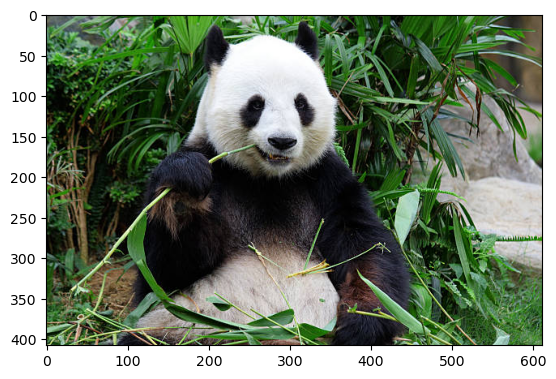

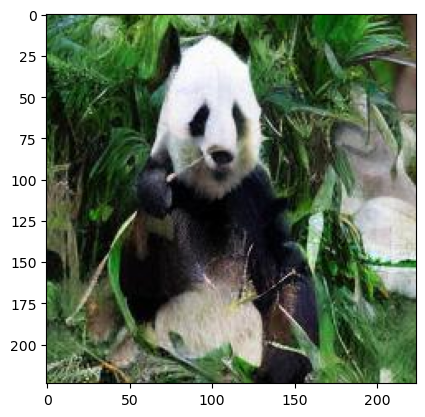

1/1 [==============================] - 0s 32ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.97654 | Logit Diff: 1.15263
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.84393 | Logit Diff: -0.32951
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.66072 | Logit Diff: -0.41186
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.64916 | Logit Diff: 2.24705
Average Difference: 0.6645787954330444
Processing image: epsilon_13.jpg
13
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 100.85it/s]


Finished attacking: epsilon_13.jpg


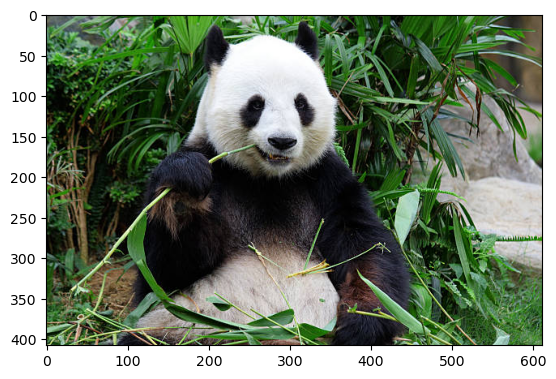

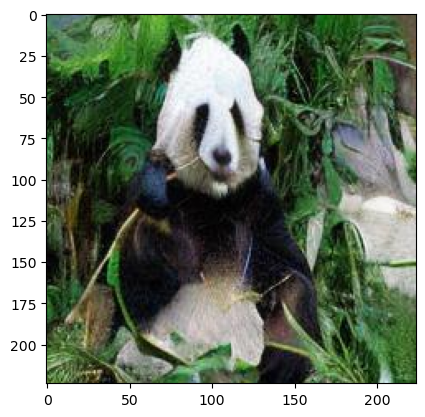

1/1 [==============================] - 0s 33ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -2.37582 | Logit Diff: 0.75335
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 1.98295 | Logit Diff: -1.19048
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.13255 | Logit Diff: -0.94002
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 2.31766 | Logit Diff: 0.91555
Average Difference: -0.11540105938911438
Processing image: epsilon_14.jpg
14
**************************************************
Attacking PGD WhiteBox Watermark with diff_attacker_60


1it [00:00, 98.08it/s]


Finished attacking: epsilon_14.jpg


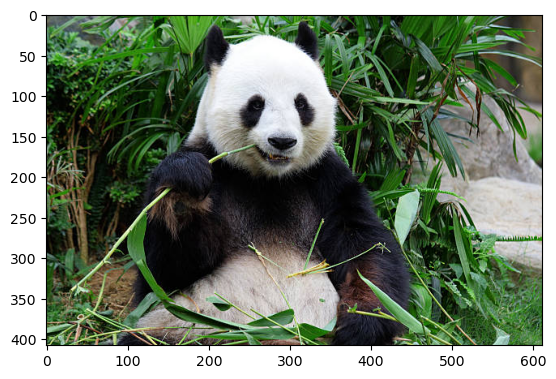

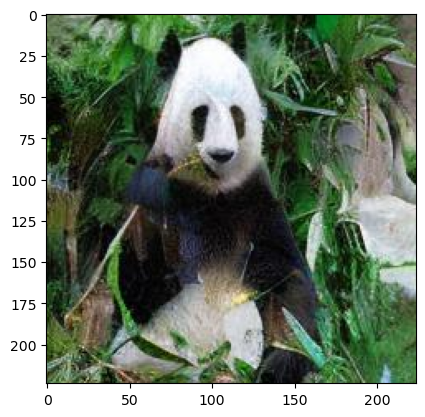

1/1 [==============================] - 0s 31ms/step
Label: plane (726) | Logit Before: -3.12917 | Logit After: -1.87382 | Logit Diff: 1.25535
Label: Cardigan (264) | Logit Before: 3.17343 | Logit After: 2.84721 | Logit Diff: -0.32622
Label: barrow (428) | Logit Before: 4.07258 | Logit After: 3.40777 | Logit Diff: -0.66481
Label: Sealyham_terrier (190) | Logit Before: 1.40211 | Logit After: 3.45899 | Logit Diff: 2.05688
Average Difference: 0.5802969932556152


In [11]:
import os
import cv2
from PIL import Image
logit_diffs_dic = {}
# Directory where the images are stored
image_dir = "./output/testing_epsilon"

# Get a list of all images in the directory
image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png'))]  # Modify for other extensions if needed

# Make sure there are images to process
if not image_files:
    print("No images found in the directory.")
else:
    # Iterate over each image file
    
    for image_file in os.listdir(image_dir):
        # Construct the full image path
        image_path = os.path.join(image_dir, image_file)
        
        print(f"Processing image: {image_file}")

        watermarked_img_path = image_path
        index = image_file.index(".")
        print(image_file[8:index])
        attacked_img_path = f"./output/attacked_images/perturbed_panda_attacked{image_file[8:index]}.jpg"
        
        
        image = Image.open(watermarked_img_path).convert("RGB")
        
        attacker_name = "diff_attacker_60"
        attacker = attackers[attacker_name]   # Select the attacker
        
        print('*' * print_width)
        print(f'Attacking PGD WhiteBox Watermark with {attacker_name}')
        
        
        # Move attacker model to CUDA if available
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        attacker.pipe.to(device)  # Ensure the model is on the right device
        
        # Apply the attack
        attacker.attack([watermarked_img_path], [attacked_img_path])
        
        print(f'Finished attacking: {image_file}')

        original_image_path = "examples/panda.jpg"
        sample_image_org = show_image(original_image_path)
        preprocessed_image_org = preprocess_image(sample_image_org)
        image_tensor_org = tf.constant(preprocessed_image_org, dtype=tf.float32)
        
        sample_image_att = show_image(attacked_img_path)
        preprocessed_image = preprocess_image(sample_image_att)
        image_tensor_att = tf.constant(preprocessed_image, dtype=tf.float32)
        
        original_logits = resnet50.predict(preprocess_input(image_tensor_org))
        attacked_logits = resnet50.predict(preprocess_input(image_tensor_att))

        verif, avg_diff = verify_watermark(original_logits, attacked_logits,
                 [726, 264, 428, 190])

        dic_key = int(image_file[8:index])
        logit_diffs_dic[dic_key] = avg_diff
        
      


In [12]:
sorted_logit_diffs_dic = {key: logit_diffs_dic[key] for key in sorted(logit_diffs_dic)}

In [14]:
epsilon_values = np.arange(0, 8/255, 0.5/255)


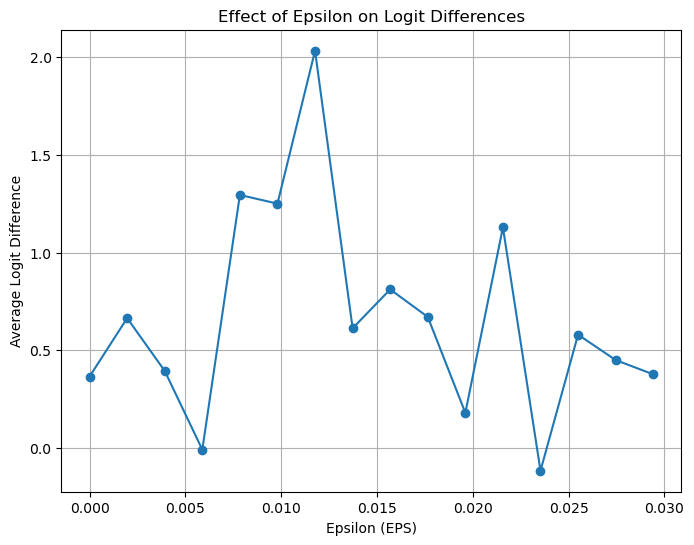

In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.plot(epsilon_values, sorted_logit_diffs_dic.values(), marker='o', linestyle='-')
plt.xlabel("Epsilon (EPS)")
plt.ylabel("Average Logit Difference")
plt.title("Effect of Epsilon on Logit Differences")
plt.grid(True)
plt.show()